In [2]:
import tensorflow as tf
from tensorflow.keras import models, layers
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.metrics import precision_score, recall_score, f1_score

In [3]:
path="E:\VS\Main dataset"
IMAGESIZE=256
BATCHSIZE=32
EPOCHS=50
CHANNELS=3

In [4]:
dataset=tf.keras.preprocessing.image_dataset_from_directory(
    path,
    shuffle=True,
    image_size=(IMAGESIZE,IMAGESIZE),
    batch_size=BATCHSIZE
)

Found 3601 files belonging to 6 classes.


In [5]:
class_names=dataset.class_names
class_names
print(class_names)
print(len(class_names))

['Aphids', 'Army worm', 'Bacterial Blight', 'Healthy', 'Powdery Mildew', 'Target spot']
6


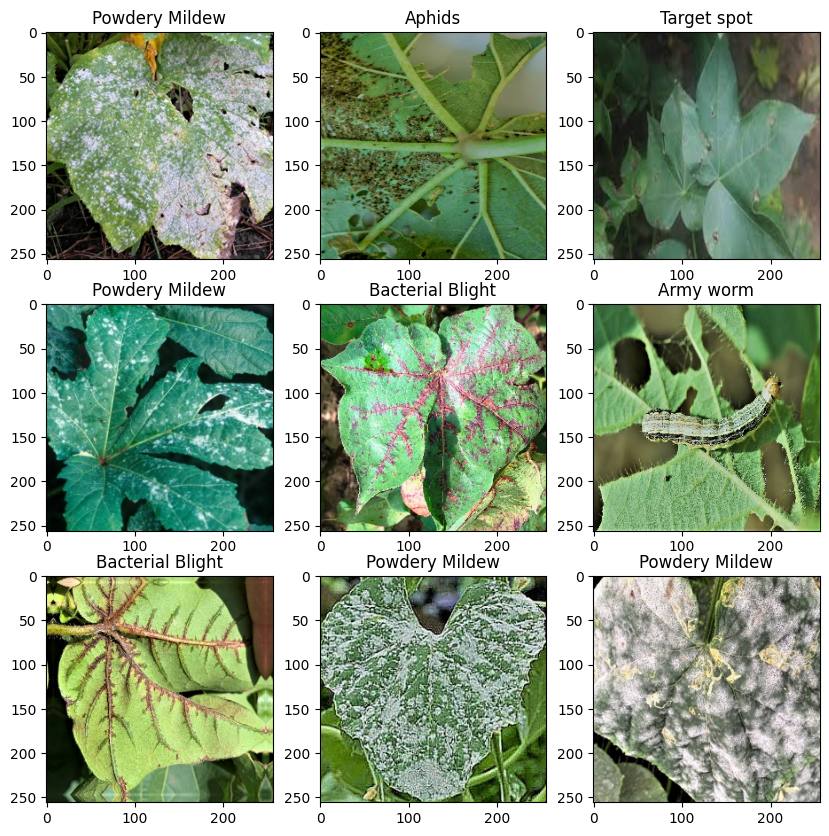

In [6]:
plt.figure(figsize=(10,10))
for image_batch,label_batch in dataset.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    plt.title(class_names[label_batch[i]])

In [7]:
def get_dataset_part(ds, t_s=.8, v_s=.1, test_s=.1, shuffle=True, shuffle_size=10000):
  ds_size=len(ds)
  if shuffle:
    ds=ds.shuffle(shuffle_size, seed=12)
  t_size=int(ds_size*t_s)
  v_size=int(ds_size*v_s)
  train_ds=ds.take(t_size)
  val_ds=ds.skip(t_size).take(v_size)
  test_ds=ds.skip(t_size).skip(v_size)

  return train_ds, val_ds, test_ds

In [8]:
train_ds, val_ds, test_ds=get_dataset_part(dataset)

In [9]:
print(f'''
Train_Dataset={len(train_ds)}
Validation_Dataset={len(val_ds)}
Test_Dataset={len(test_ds)}''')


Train_Dataset=90
Validation_Dataset=11
Test_Dataset=12


In [10]:
train_ds=train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test=test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [11]:
resize_and_rescale=tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGESIZE,IMAGESIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)])

In [12]:
data_aug=tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)])

In [13]:
input_shape=(IMAGESIZE,IMAGESIZE,CHANNELS)
n_classes= len(class_names)
model=models.Sequential([
    resize_and_rescale,
    data_aug,
    layers.Conv2D(32,(3,3), activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(128,(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(256,(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(512,activation='relu'),
    layers.Dense(6,activation='softmax')
])
model.build(input_shape=(32,256,256,3))

In [14]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (32, 127, 127, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (32, 62, 62, 64)         0         
 2D)                                                  

In [15]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy'])

In [16]:
history=model.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCHSIZE,
    verbose=1,
    validation_data=val_ds
)

Epoch 1/50
90/90 [==============================] - 112s 1s/step - loss: 1.6338 - accuracy: 0.2817 - val_loss: 1.5041 - val_accuracy: 0.3693
Epoch 2/50
90/90 [==============================] - 105s 1s/step - loss: 1.3802 - accuracy: 0.4314 - val_loss: 1.2786 - val_accuracy: 0.4347
Epoch 3/50
90/90 [==============================] - 103s 1s/step - loss: 1.2172 - accuracy: 0.5096 - val_loss: 1.1537 - val_accuracy: 0.4972
Epoch 4/50
90/90 [==============================] - 105s 1s/step - loss: 1.0911 - accuracy: 0.5686 - val_loss: 1.2028 - val_accuracy: 0.5341
Epoch 5/50
90/90 [==============================] - 104s 1s/step - loss: 0.9776 - accuracy: 0.6244 - val_loss: 0.9362 - val_accuracy: 0.6222
Epoch 6/50
90/90 [==============================] - 108s 1s/step - loss: 0.8713 - accuracy: 0.6754 - val_loss: 0.7426 - val_accuracy: 0.7159
Epoch 7/50
90/90 [==============================] - 105s 1s/step - loss: 0.7579 - accuracy: 0.7257 - val_loss: 0.6879 - val_accuracy: 0.7216
Epoch 8/50
90

In [17]:
scores=model.evaluate(test_ds)

12/12 [==============================] - 8s 275ms/step - loss: 0.0921 - accuracy: 0.9783


In [18]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
loss=history.history['loss']
val_loss=history.history['val_loss']

Text(0.5, 1.0, 'Training and Validation Loss')

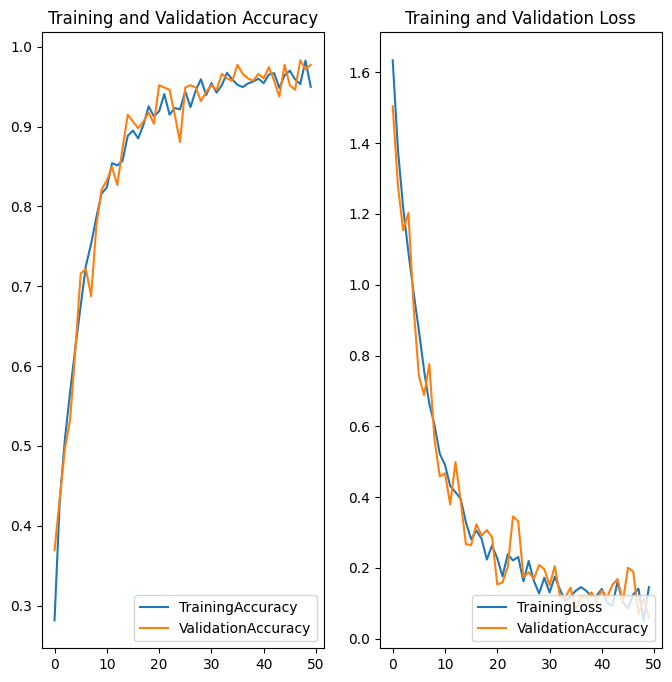

In [19]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc,label='TrainingAccuracy')
plt.plot(range(EPOCHS),val_acc,label='ValidationAccuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss,label='TrainingLoss')
plt.plot(range(EPOCHS),val_loss,label='ValidationAccuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Loss')

In [20]:
model.save('E:\VS\Main dataset\model_1_03333330.h5')

first image to predict
actual label: Target spot
1/1 [==============================] - 0s 425ms/step
predicted label: Target spot


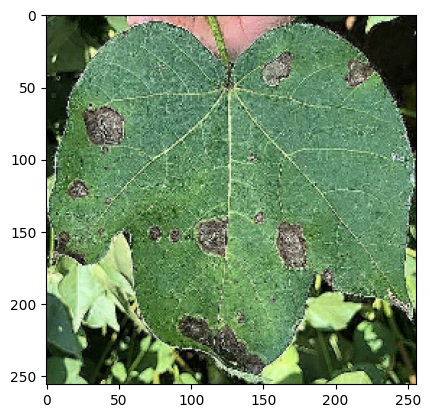

In [21]:
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [22]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 32ms/step
Precision: 100.00%
Recall: 100.00%
F1 Score: 100.00%


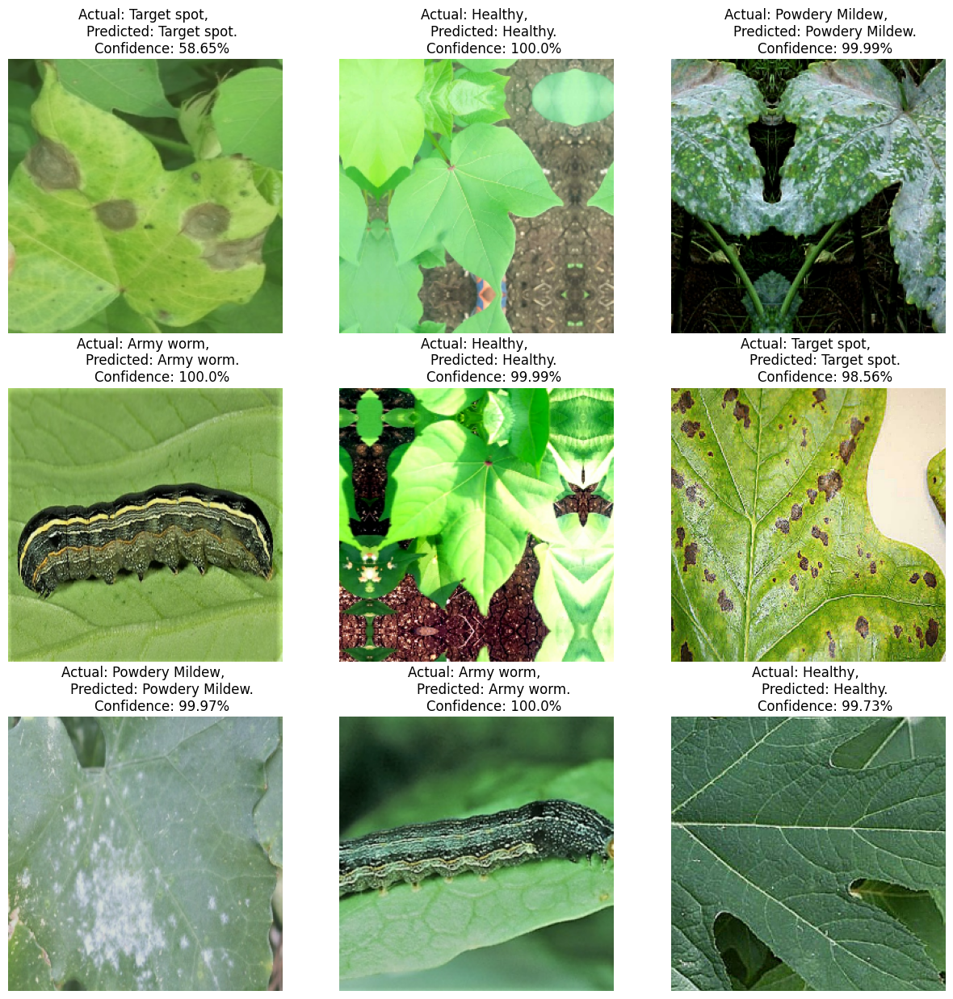

In [23]:
plt.figure(figsize=(15, 15))


true_labels = []
predicted_labels = []

for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        true_labels.append(actual_class)
        predicted_labels.append(predicted_class)

        plt.title(f"""Actual: {actual_class}, 
        Predicted: {predicted_class}.
        Confidence: {confidence}%""")
        plt.axis("off") 


precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')


precision_percentage = precision * 100
recall_percentage = recall * 100
f1_percentage = f1 * 100


print("Precision: {:.2f}%".format(precision_percentage))
print("Recall: {:.2f}%".format(recall_percentage))
print("F1 Score: {:.2f}%".format(f1_percentage))

1/1 [==============================] - 0s 34ms/step
Precision: 100.00%
Recall: 100.00%
F1 Score: 100.00%


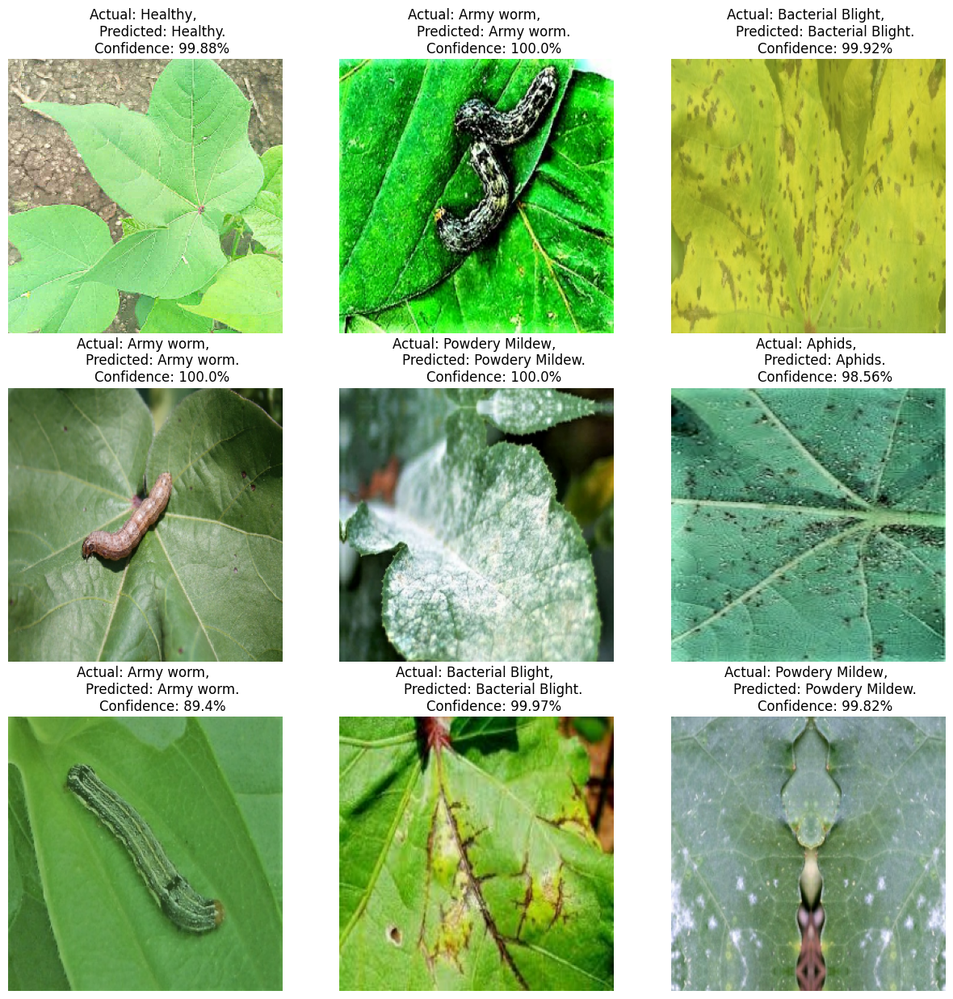

In [24]:
plt.figure(figsize=(15, 15))


true_labels = []
predicted_labels = []

for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        true_labels.append(actual_class)
        predicted_labels.append(predicted_class)

        plt.title(f"""Actual: {actual_class}, 
        Predicted: {predicted_class}.
        Confidence: {confidence}%""")
        plt.axis("off") 


precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')


precision_percentage = precision * 100
recall_percentage = recall * 100
f1_percentage = f1 * 100


print("Precision: {:.2f}%".format(precision_percentage))
print("Recall: {:.2f}%".format(recall_percentage))
print("F1 Score: {:.2f}%".format(f1_percentage))

1/1 [==============================] - 0s 39ms/step
Precision: 100.00%
Recall: 100.00%
F1 Score: 100.00%


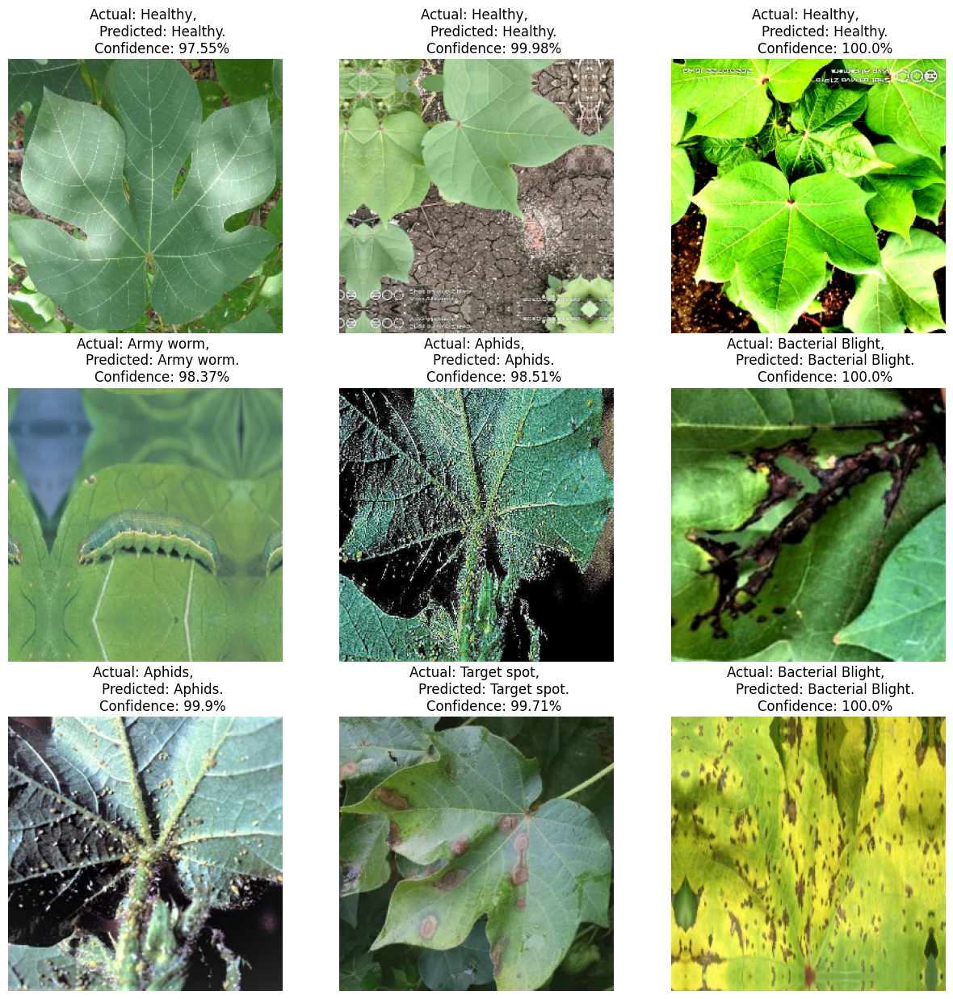

In [25]:
plt.figure(figsize=(15, 15))


true_labels = []
predicted_labels = []

for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        true_labels.append(actual_class)
        predicted_labels.append(predicted_class)

        plt.title(f"""Actual: {actual_class}, 
        Predicted: {predicted_class}.
        Confidence: {confidence}%""")
        plt.axis("off") 


precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')


precision_percentage = precision * 100
recall_percentage = recall * 100
f1_percentage = f1 * 100


print("Precision: {:.2f}%".format(precision_percentage))
print("Recall: {:.2f}%".format(recall_percentage))
print("F1 Score: {:.2f}%".format(f1_percentage))

1/1 [==============================] - 0s 31ms/step
Precision: 100.00%
Recall: 100.00%
F1 Score: 100.00%


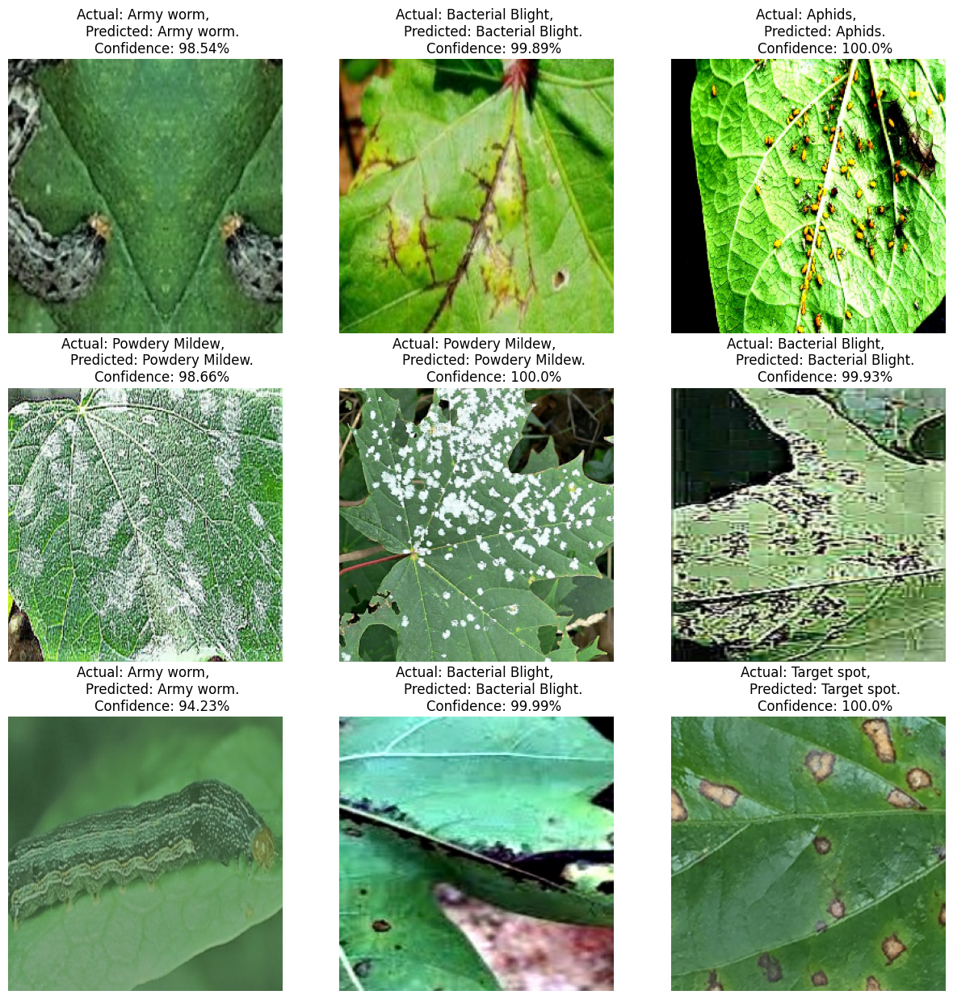

In [26]:
plt.figure(figsize=(15, 15))


true_labels = []
predicted_labels = []

for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        true_labels.append(actual_class)
        predicted_labels.append(predicted_class)

        plt.title(f"""Actual: {actual_class}, 
        Predicted: {predicted_class}.
        Confidence: {confidence}%""")
        plt.axis("off") 


precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')


precision_percentage = precision * 100
recall_percentage = recall * 100
f1_percentage = f1 * 100


print("Precision: {:.2f}%".format(precision_percentage))
print("Recall: {:.2f}%".format(recall_percentage))
print("F1 Score: {:.2f}%".format(f1_percentage))

1/1 [==============================] - 0s 35ms/step
Precision: 100.00%
Recall: 100.00%
F1 Score: 100.00%


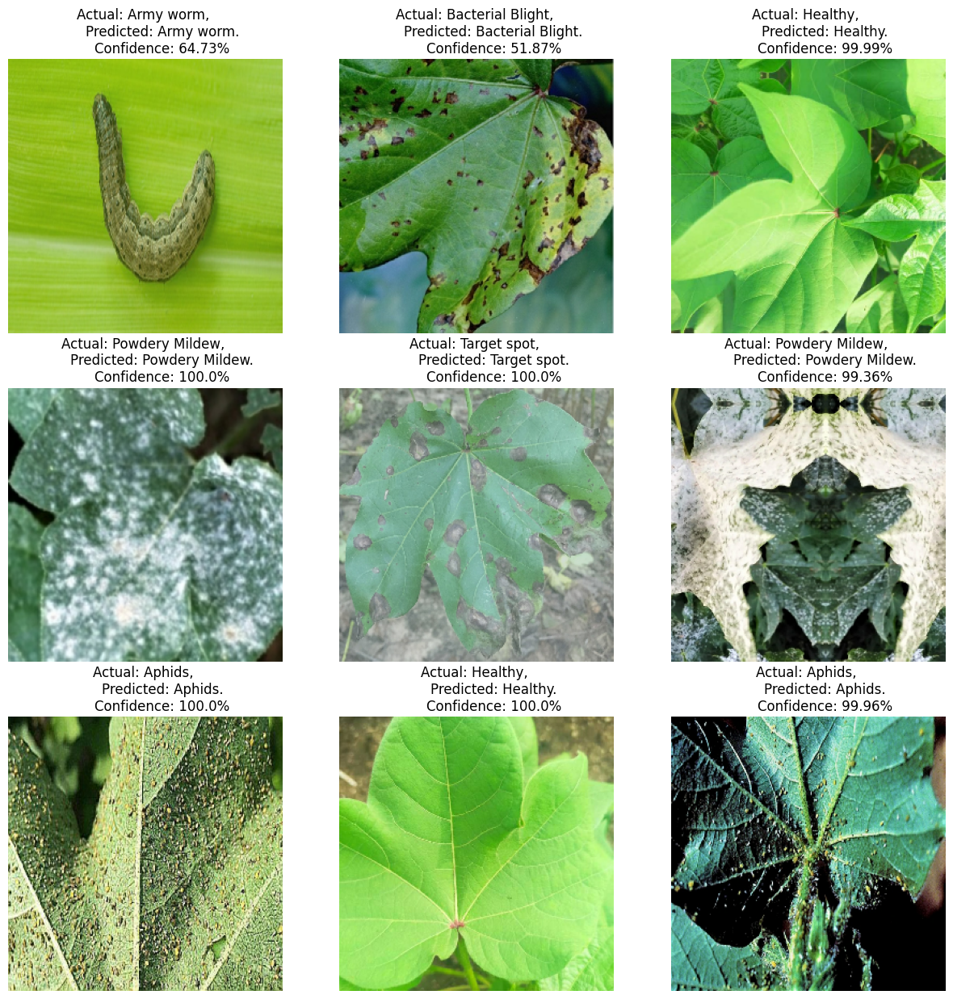

In [27]:
plt.figure(figsize=(15, 15))


true_labels = []
predicted_labels = []

for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        true_labels.append(actual_class)
        predicted_labels.append(predicted_class)

        plt.title(f"""Actual: {actual_class}, 
        Predicted: {predicted_class}.
        Confidence: {confidence}%""")
        plt.axis("off") 


precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')


precision_percentage = precision * 100
recall_percentage = recall * 100
f1_percentage = f1 * 100


print("Precision: {:.2f}%".format(precision_percentage))
print("Recall: {:.2f}%".format(recall_percentage))
print("F1 Score: {:.2f}%".format(f1_percentage))

In [31]:
from tabulate import tabulate
data = [["1", "100 %", "100 %", "100 %"], 
        ["2", "100 %", "100 %", "100 %"], 
        ["3", "100 %", "100 %", "100 %"],
        ["4", "100 %", "100 %", "100 %"]]
  

col_names = ["Test No.", "Precision_score","Recall_score","F1_score"]
  

print(tabulate(data, headers=col_names, tablefmt="grid"))

+------------+-------------------+----------------+------------+
|   Test No. | Precision_score   | Recall_score   | F1_score   |
+============+===================+================+============+
|          1 | 100 %             | 100 %          | 100 %      |
+------------+-------------------+----------------+------------+
|          2 | 100 %             | 100 %          | 100 %      |
+------------+-------------------+----------------+------------+
|          3 | 100 %             | 100 %          | 100 %      |
+------------+-------------------+----------------+------------+
|          4 | 100 %             | 100 %          | 100 %      |
+------------+-------------------+----------------+------------+
